In [1]:
import json
from typing import List, Tuple

import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
from rich import print
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
from PIL import Image
from clip import tokenize
from transformers import CLIPVisionModelWithProjection, CLIPTextModelWithProjection, CLIPImageProcessor

from src.data_utils import FashionIQDataset
from src.utils import extract_index_features_clip, device, extract_index_features_with_text_captions_clip
from src.validate_clip import generate_fiq_val_predictions

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 1: Modify the function for calculation in different alpha values</div>

# <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform alpha search for the best alpha value after the search and index were encoded</div>

In [2]:
def compute_fiq_val_metrics_text_image_modified(
    relative_val_dataset: FashionIQDataset,
    clip_text_encoder: torch.nn.Module,
    clip_tokenizer,
    multiple_text_index_features: List[torch.tensor],
    multiple_text_index_names: List[List[str]],
    image_index_features: torch.tensor,
    image_index_names: List[str],
    combining_function: callable
) -> pd.DataFrame:
    """
    Compute validation metrics on FashionIQ dataset combining text and image distances.

    :param relative_val_dataset: FashionIQ validation dataset in relative mode
    :param clip_text_encoder: CLIP text encoder
    :param clip_tokenizer: CLIP tokenizer
    :param multiple_text_index_features: validation index features from text
    :param multiple_text_index_names: validation index names from text
    :param image_index_features: validation image index features
    :param image_index_names: validation image index names
    :param combining_function: function that combines features
    :return: the computed validation metrics
    """
    all_text_distances = []
    results = []
    alphas = np.arange(0, 1.05, 0.05)
    target_names = None

    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_text_index_features, multiple_text_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, target_names = generate_fiq_val_predictions(
            clip_text_encoder,
            clip_tokenizer,
            relative_val_dataset,
            combining_function,
            text_names,
            text_features
        )
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)

    # Normalize and compute distances for image features if available
    if image_index_features is not None and len(image_index_features) > 0:
        predicted_image_features, _ = generate_fiq_val_predictions(
            clip_text_encoder,
            clip_tokenizer,
            relative_val_dataset,
            combining_function, image_index_names,
            image_index_features
        )

        # Normalize and compute distances
        image_index_features = F.normalize(image_index_features, dim=-1).float()
        image_distances = 1 - predicted_image_features @ image_index_features.T
    else:
        image_distances = torch.zeros_like(all_text_distances[0])

    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)

    # Iterating over alpha values
    for alpha in alphas:
        merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances
        sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
        sorted_index_names = np.array(image_index_names if image_index_names else multiple_text_index_names[0])[
            sorted_indices]
        labels = torch.tensor(
            sorted_index_names == np.repeat(np.array(target_names),
                                            len(image_index_names if image_index_names else multiple_text_index_names[
                                                0])).reshape(len(target_names), -1))
        assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
        recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
        recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100
        results.append({"alpha": alpha, "recall_at10": recall_at10, "recall_at50": recall_at50})

    return pd.DataFrame(results)

In [3]:
def fashioniq_val_retrieval_text_image_modified(
    dress_type: str,
    combining_function: callable,
    clip_text_encoder: torch.nn.Module,
    clip_img_encoder: torch.nn.Module,
    clip_tokenizer,
    text_captions: List[dict],
    preprocess: callable):
    """
    Perform retrieval on FashionIQ validation set computing the metrics. To combine the features the `combining_function`
    is used
    :param dress_type: FashionIQ category on which perform the retrieval
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined  features
    :param clip_text_encoder: CLIP text model
    :param clip_img_encoder: CLIP image model
    :param clip_tokenizer: CLIP tokenizer
    :param text_captions: text captions for the FashionIQ dataset
    :param preprocess: preprocess pipeline
    """

    clip_text_encoder = clip_text_encoder.float().eval()
    clip_img_encoder = clip_img_encoder.float().eval()

    # Define the validation datasets and extract the index features
    classic_val_dataset = FashionIQDataset('val', [dress_type], 'classic', preprocess)

    multiple_index_features, multiple_index_names = [], []

    for i in range(3):
        index_features, index_names, _ = extract_index_features_with_text_captions_clip(
            classic_val_dataset,
            clip_text_encoder,
            clip_tokenizer,
            text_captions,
            i + 1
        )
        multiple_index_features.append(index_features)
        multiple_index_names.append(index_names)

    image_index_features, image_index_names = extract_index_features_clip(
        classic_val_dataset, clip_img_encoder
    )

    relative_val_dataset = FashionIQDataset('val', [dress_type], 'relative', preprocess)

    return compute_fiq_val_metrics_text_image_modified(
        relative_val_dataset,
        clip_text_encoder,
        clip_tokenizer,
        multiple_index_features,
        multiple_index_names,
        image_index_features,
        image_index_names,
        combining_function
    )

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 2: Load the CLIP model and the Combiner</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Same concept as script version here</div>

In [4]:
CLIP_NAME = 'laion/CLIP-ViT-H-14-laion2B-s32B-b79K'

In [5]:
clip_text_encoder = CLIPTextModelWithProjection.from_pretrained(CLIP_NAME, torch_dtype=torch.float32)
clip_text_encoder = clip_text_encoder.float().to(device)

print("clip text encoder loaded.")
clip_text_encoder.eval()

clip text encoder loaded.

CLIPTextModelWithProjection(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 1024)
      (position_embedding): Embedding(77, 1024)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-23): 24 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (v_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (q_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (out_proj): Linear(in_features=1024, out_features=1024, bias=True)
          )
          (layer_norm1): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=1024, out_features=4096, bias=True)
            (fc2): Linear(in_features=4096, out_features=1024, bias=True)
          )
          (layer_norm2): La

In [6]:
clip_img_encoder = CLIPVisionModelWithProjection.from_pretrained(CLIP_NAME, torch_dtype=torch.float32)

clip_img_encoder = clip_img_encoder.float().to(device)
print("clip img encoder loaded.")
clip_img_encoder = clip_img_encoder.eval()

clip img encoder loaded.

In [7]:
print('CLIP preprocess pipeline is used')
preprocess = CLIPImageProcessor(
    crop_size={'height': 224, 'width': 224},
    do_center_crop=True,
    do_convert_rgb=True,
    do_normalize=True,
    do_rescale=True,
    do_resize=True,
    image_mean=[0.48145466, 0.4578275, 0.40821073],
    image_std=[0.26862954, 0.26130258, 0.27577711],
    resample=3,
    size={'shortest_edge': 224},
)

CLIP preprocess pipeline is used

In [8]:
clip_tokenizer = tokenize

In [9]:
def element_wise_sum_original(image_features: torch.tensor, text_features: torch.tensor) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize(image_features + text_features, dim=-1)

In [10]:
combining_function_original = element_wise_sum_original

In [11]:
def element_wise_sum(image_features: torch.tensor, text_features: torch.tensor, beta=0.65) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :param beta: weight for text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize((1 - beta) * image_features + beta * text_features, dim=-1)

In [12]:
combining_function = lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=0.65)

In [13]:
def get_combing_function_with_beta(beta: float):
    return lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=beta)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 3: Perform retrieval on the FashionIQ dataset</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Load the addition text captions and perform retrieval on the FashionIQ dataset</div>

In [14]:
with open('../fashionIQ_dataset/labeled_images_cir_cleaned.json', 'r') as f:
    text_captions = json.load(f)
    
total_recall_list: List[List[pd.DataFrame]] = []

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to convert the list of DataFrames to a single DataFrame with a pivot table structure</div>

In [15]:
def convert_to_pivot(data: List[pd.DataFrame]) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Convert a list of DataFrames to a single DataFrame with a pivot table structure.
    :param data: list of DataFrames
    :param column_name: name of the column to use as the index
    :return: a single DataFrame with a pivot table structure
    """
    concatenated_data = []
    betas = np.arange(0, 1.05, 0.05)

    # Concatenate dataframes for all betas and add beta_index, beta_df in enumerate(data):
    for beta_index, beta_df in enumerate(data):
        beta_df['beta'] = round(betas[beta_index], 2)  # Round to two decimal places
        concatenated_data.append(beta_df)

    # Create one dataframe per category
    category_df = pd.concat(concatenated_data, ignore_index=True)
    
    # Create pivot tables for recall@10 and recall@50
    recall_at10 = category_df.pivot_table(index='alpha', columns='beta', values='recall_at10')
    recall_at50 = category_df.pivot_table(index='alpha', columns='beta', values='recall_at50')
    
    return recall_at10, recall_at50

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the shirt category</div>

In [16]:
grid_search_betas = np.arange(0, 1.05, 0.05)
shirt_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    shirt_recall = fashioniq_val_retrieval_text_image_modified(
        'shirt',
        get_combing_function_with_beta(beta),
        clip_text_encoder,
        clip_img_encoder,
        clip_tokenizer,
        text_captions,
        preprocess
    )
    print(f"Shirt recall at 10 for beta={beta}: {shirt_recall['recall_at10'].max()}")
    print(f"Shirt recall at 50 for beta={beta}: {shirt_recall['recall_at50'].max()}")
    
    shirt_recall_list.append(shirt_recall)
    
shirt_recall_at10, shirt_recall_at50 = convert_to_pivot(shirt_recall_list)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:22<00:00,  1.39it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 12:53:46.649641] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.20it/s]


[2024-06-09 12:53:53.618117] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  8.61it/s]


[2024-06-09 12:54:01.061522] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  8.59it/s]


[2024-06-09 12:54:08.523161] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  8.57it/s]


Shirt recall at 10 for beta=0.0: 14.131501317024231

Shirt recall at 50 for beta=0.0: 27.23258137702942

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:20<00:00,  1.41it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 12:57:46.270469] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.94it/s]


[2024-06-09 12:57:52.720421] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.25it/s]


[2024-06-09 12:57:59.645651] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.29it/s]


[2024-06-09 12:58:06.544867] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


Shirt recall at 10 for beta=0.05: 14.57311064004898

Shirt recall at 50 for beta=0.05: 27.968597412109375

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:21<00:00,  1.41it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 13:01:45.777197] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.90it/s]


[2024-06-09 13:01:52.253274] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.21it/s]


[2024-06-09 13:01:59.208236] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.21it/s]


[2024-06-09 13:02:06.166534] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.20it/s]


Shirt recall at 10 for beta=0.1: 14.96565192937851

Shirt recall at 50 for beta=0.1: 28.753679990768433

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:22<00:00,  1.40it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 13:05:45.764321] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.81it/s]


[2024-06-09 13:05:52.295739] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.12it/s]


[2024-06-09 13:05:59.317995] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.27it/s]


[2024-06-09 13:06:06.336686] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


Shirt recall at 10 for beta=0.15000000000000002: 15.45632928609848

Shirt recall at 50 for beta=0.15000000000000002: 29.636898636817932

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:22<00:00,  1.40it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 13:09:46.517272] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.81it/s]


[2024-06-09 13:09:53.051642] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.14it/s]


[2024-06-09 13:10:00.060402] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.14it/s]


[2024-06-09 13:10:07.068749] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.18it/s]


Shirt recall at 10 for beta=0.2: 16.33954793214798

Shirt recall at 50 for beta=0.2: 30.323848128318787

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:21<00:00,  1.40it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 13:13:46.220540] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.83it/s]


[2024-06-09 13:13:52.739658] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.15it/s]


[2024-06-09 13:13:59.740793] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.15it/s]


[2024-06-09 13:14:06.748399] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.18it/s]


Shirt recall at 10 for beta=0.25: 17.075563967227936

Shirt recall at 50 for beta=0.25: 31.648674607276917

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:21<00:00,  1.40it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 13:17:46.166179] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.91it/s]


[2024-06-09 13:17:52.635093] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.19it/s]


[2024-06-09 13:17:59.609790] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.23it/s]


[2024-06-09 13:18:06.552763] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.21it/s]


Shirt recall at 10 for beta=0.30000000000000004: 17.860648036003113

Shirt recall at 50 for beta=0.30000000000000004: 33.16977322101593

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:21<00:00,  1.41it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 13:21:45.161878] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.83it/s]


[2024-06-09 13:21:51.684548] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.14it/s]


[2024-06-09 13:21:58.693040] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.14it/s]


[2024-06-09 13:22:05.703079] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.14it/s]


Shirt recall at 10 for beta=0.35000000000000003: 19.185476005077362

Shirt recall at 50 for beta=0.35000000000000003: 34.789007902145386

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:22<00:00,  1.40it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 13:25:45.448470] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.83it/s]


[2024-06-09 13:25:51.970817] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.14it/s]


[2024-06-09 13:25:58.985691] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


[2024-06-09 13:26:06.000917] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.14it/s]


Shirt recall at 10 for beta=0.4: 20.755642652511597

Shirt recall at 50 for beta=0.4: 36.94798946380615

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:21<00:00,  1.40it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 13:29:45.644382] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.85it/s]


[2024-06-09 13:29:52.153395] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


[2024-06-09 13:29:59.170728] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.14it/s]


[2024-06-09 13:30:06.183208] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.15it/s]


Shirt recall at 10 for beta=0.45: 22.66928404569626

Shirt recall at 50 for beta=0.45: 39.54857587814331

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:21<00:00,  1.40it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 13:33:45.503455] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.00it/s]


[2024-06-09 13:33:52.021782] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.15it/s]


[2024-06-09 13:33:59.024850] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.15it/s]


[2024-06-09 13:34:06.031789] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.16it/s]


Shirt recall at 10 for beta=0.5: 25.02453327178955

Shirt recall at 50 for beta=0.5: 42.14916527271271

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:21<00:00,  1.41it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 13:37:45.254277] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.88it/s]


[2024-06-09 13:37:51.738925] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.16it/s]


[2024-06-09 13:37:58.733785] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.14it/s]


[2024-06-09 13:38:05.746766] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


Shirt recall at 10 for beta=0.55: 27.625122666358948

Shirt recall at 50 for beta=0.55: 44.89695727825165

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:21<00:00,  1.40it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 13:41:45.110161] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.84it/s]


[2024-06-09 13:41:51.623492] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.17it/s]


[2024-06-09 13:41:58.611461] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.20it/s]


[2024-06-09 13:42:05.577577] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.21it/s]


Shirt recall at 10 for beta=0.6000000000000001: 30.52011728286743

Shirt recall at 50 for beta=0.6000000000000001: 47.3503440618515

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:21<00:00,  1.41it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 13:45:44.220363] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.88it/s]


[2024-06-09 13:45:50.708745] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.17it/s]


[2024-06-09 13:45:57.698799] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.18it/s]


[2024-06-09 13:46:04.677617] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.18it/s]


Shirt recall at 10 for beta=0.65: 32.63002932071686

Shirt recall at 50 for beta=0.65: 49.41118657588959

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:22<00:00,  1.40it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 13:49:44.358997] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.85it/s]


[2024-06-09 13:49:50.866603] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.16it/s]


[2024-06-09 13:49:57.863695] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.16it/s]


[2024-06-09 13:50:04.860700] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


Shirt recall at 10 for beta=0.7000000000000001: 35.08341610431671

Shirt recall at 50 for beta=0.7000000000000001: 51.61923170089722

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:22<00:00,  1.40it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 13:53:44.469649] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.87it/s]


[2024-06-09 13:53:50.962230] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.18it/s]


[2024-06-09 13:53:57.946485] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.18it/s]


[2024-06-09 13:54:04.924163] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.16it/s]


Shirt recall at 10 for beta=0.75: 36.50637865066528

Shirt recall at 50 for beta=0.75: 52.944064140319824

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:21<00:00,  1.40it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 13:57:43.822575] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.84it/s]


[2024-06-09 13:57:50.338706] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.20it/s]


[2024-06-09 13:57:57.311526] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.19it/s]


[2024-06-09 13:58:04.286655] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.21it/s]


Shirt recall at 10 for beta=0.8: 36.555445194244385

Shirt recall at 50 for beta=0.8: 53.5819411277771

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:21<00:00,  1.41it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 14:01:43.114177] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.88it/s]


[2024-06-09 14:01:49.602162] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.20it/s]


[2024-06-09 14:01:56.569319] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.20it/s]


[2024-06-09 14:02:03.533557] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.20it/s]


Shirt recall at 10 for beta=0.8500000000000001: 34.64180529117584

Shirt recall at 50 for beta=0.8500000000000001: 51.47203207015991

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:20<00:00,  1.41it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 14:05:41.460155] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.08it/s]


[2024-06-09 14:05:47.919312] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.23it/s]


[2024-06-09 14:05:54.861235] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.25it/s]


[2024-06-09 14:06:01.790689] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.23it/s]


Shirt recall at 10 for beta=0.9: 31.207066774368286

Shirt recall at 50 for beta=0.9: 48.2826292514801

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:20<00:00,  1.41it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 14:09:39.320753] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.92it/s]


[2024-06-09 14:09:45.784987] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.24it/s]


[2024-06-09 14:09:52.719284] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.24it/s]


[2024-06-09 14:09:59.656671] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.22it/s]


Shirt recall at 10 for beta=0.9500000000000001: 26.88910663127899

Shirt recall at 50 for beta=0.9500000000000001: 43.424925208091736

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:21<00:00,  1.41it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 14:13:38.091870] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.89it/s]


[2024-06-09 14:13:44.573436] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.20it/s]


[2024-06-09 14:13:51.536727] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.19it/s]


[2024-06-09 14:13:58.505554] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.20it/s]


Shirt recall at 10 for beta=1.0: 23.797841370105743

Shirt recall at 50 for beta=1.0: 39.20510411262512

In [17]:
shirt_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,14.131501,14.573111,14.916585,15.358195,16.045143,16.683023,17.419039,18.351325,19.578017,21.540727,...,25.809616,28.213936,30.814525,33.611384,34.838077,35.426888,34.151128,30.569187,26.300293,22.816487
0.05,14.033367,14.376840,14.965652,15.456329,16.339548,16.830225,17.713444,18.498528,19.528949,21.589793,...,26.545632,28.900883,31.746811,34.200197,35.623160,35.868499,34.543669,30.912659,26.889107,23.405299
0.10,13.935231,14.425908,14.622179,15.358195,16.290481,17.075564,17.860648,18.645731,19.872424,21.786065,...,26.889107,29.685965,32.335624,34.396467,36.506379,36.555445,34.641805,31.207067,26.790971,23.797841
0.15,13.542689,13.984299,14.376840,14.916585,15.799804,16.879293,17.615309,18.547596,20.019627,21.835132,...,26.938176,30.127576,32.384691,34.739941,36.408243,35.966635,34.445536,31.108931,26.153091,23.797841
0.20,13.297351,13.935231,14.425908,15.063788,15.652600,16.633955,17.664377,19.136408,20.264965,22.325809,...,27.526987,30.520117,32.630029,35.083416,36.162904,35.426888,33.562315,30.127576,26.889107,23.356232
0.25,12.953876,13.493621,14.082433,14.622179,15.456329,16.535820,17.615309,19.185476,20.755643,22.669284,...,27.625123,29.833171,32.335624,34.690875,35.279685,34.690875,32.041216,29.195291,26.545632,23.552503
0.30,12.463199,13.002944,13.542689,14.180569,14.818449,15.947007,16.977429,18.645731,20.166831,22.423945,...,27.036309,29.342493,32.531893,34.200197,34.789008,33.022571,30.863592,28.361139,25.956821,23.552503
0.35,11.972522,12.512267,13.101080,13.640824,14.425908,15.309127,16.732091,18.400392,20.019627,22.276741,...,27.085379,28.999019,32.139352,33.366045,33.366045,31.795877,30.029440,27.477920,25.171736,23.159961
0.40,11.874387,12.217861,12.904808,13.395485,13.984299,14.867517,15.947007,17.517173,19.185476,21.589793,...,26.594701,28.753680,31.256133,31.992149,32.237488,30.569187,28.949952,26.741904,24.631992,22.620216


In [19]:
shirt_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,26.643768,27.576056,28.361139,28.999019,29.784101,30.863592,32.041216,33.660451,35.623160,36.947989,...,42.885181,45.240432,47.203141,50.196272,51.913643,52.355248,50.736016,47.742885,42.296368,37.684003
0.05,27.134445,27.821395,28.753680,29.636899,30.323848,31.207067,32.875368,34.249264,36.064771,37.880275,...,43.081453,45.731109,48.380765,50.883222,52.649659,53.238469,51.472032,47.939157,42.934248,38.665357
0.10,27.232581,27.968597,28.655544,29.587832,30.323848,31.550539,32.875368,34.494603,36.800784,38.910696,...,43.866536,46.221787,48.626104,51.373893,52.796859,53.581941,51.226693,48.282629,43.228656,38.812563
0.15,26.643768,27.625123,28.312069,29.195291,30.225712,31.648675,32.973504,34.789008,36.947989,39.106968,...,44.504416,46.908733,49.411187,51.619232,52.944064,53.140336,51.373893,47.939157,43.424925,39.205104
0.20,26.153091,27.330717,27.919528,28.900883,29.784101,31.157997,33.169773,34.789008,36.751717,39.548576,...,44.700688,47.006869,49.263984,51.472032,52.551520,52.796859,51.030421,47.301275,42.541707,39.156035
0.25,25.662413,26.692837,27.428851,28.606477,29.784101,30.961728,33.022571,34.739941,36.800784,39.401373,...,44.504416,47.350344,49.067715,51.373893,52.453387,52.208048,50.245339,46.221787,42.296368,39.008832
0.30,24.975467,25.956821,26.889107,27.919528,29.342493,30.520117,32.433757,34.445536,36.653581,39.156035,...,44.896957,47.252208,49.411187,50.932288,52.208048,51.128560,48.577037,45.142296,41.609421,38.370952
0.35,24.484789,25.515211,26.447499,27.576056,28.999019,30.372915,32.041216,34.003925,36.653581,38.910696,...,44.602552,46.908733,49.067715,50.736016,51.570165,50.147206,47.595683,43.719333,40.775269,37.782139
0.40,23.356232,24.730128,26.104024,27.036309,28.263003,29.980373,31.697744,33.562315,36.162904,38.763493,...,43.817469,46.516192,48.626104,49.754661,50.441611,48.871443,46.172717,42.443573,39.744848,36.702651


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the dress category</div>

In [20]:
grid_search_betas = np.arange(0, 1.05, 0.05)
dress_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    dress_recall = fashioniq_val_retrieval_text_image_modified(
        'dress',
        get_combing_function_with_beta(beta),
        clip_text_encoder,
        clip_img_encoder,
        clip_tokenizer,
        text_captions,
        preprocess
    )
    print(f"Dress recall at 10 for beta={beta}: {dress_recall['recall_at10'].max()}")
    print(f"Dress recall at 50 for beta={beta}: {dress_recall['recall_at50'].max()}")
    
    dress_recall_list.append(dress_recall)

dress_recall_at10, dress_recall_at50 = convert_to_pivot(dress_recall_list)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.42it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 14:16:59.265913] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.19it/s]


[2024-06-09 14:17:06.237428] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.29it/s]


[2024-06-09 14:17:12.461220] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.47it/s]


[2024-06-09 14:17:19.229317] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.45it/s]


Dress recall at 10 for beta=0.0: 5.800694227218628

Dress recall at 50 for beta=0.0: 16.807138919830322

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:23<00:00,  1.43it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 14:19:31.712227] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.06it/s]


[2024-06-09 14:19:38.086117] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.44it/s]


[2024-06-09 14:19:44.868629] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.44it/s]


[2024-06-09 14:19:51.654401] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.39it/s]


Dress recall at 10 for beta=0.05: 6.197322905063629

Dress recall at 50 for beta=0.05: 17.550818622112274

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.42it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 14:22:04.416237] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.08it/s]


[2024-06-09 14:22:10.774441] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.41it/s]


[2024-06-09 14:22:17.586348] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.42it/s]


[2024-06-09 14:22:24.385732] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.46it/s]


Dress recall at 10 for beta=0.1: 6.44521564245224

Dress recall at 50 for beta=0.1: 18.195340037345886

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.42it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 14:24:37.089440] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.04it/s]


[2024-06-09 14:24:43.470995] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.39it/s]


[2024-06-09 14:24:50.296549] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.39it/s]


[2024-06-09 14:24:57.119601] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.37it/s]


Dress recall at 10 for beta=0.15000000000000002: 6.941001117229462

Dress recall at 50 for beta=0.15000000000000002: 19.18691098690033

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.42it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 14:27:10.587713] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.96it/s]


[2024-06-09 14:27:17.019000] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.39it/s]


[2024-06-09 14:27:23.839296] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.38it/s]


[2024-06-09 14:27:30.666714] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.35it/s]


Dress recall at 10 for beta=0.2: 7.436787337064743

Dress recall at 50 for beta=0.2: 20.079325139522552

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.42it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 14:29:44.283782] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.01it/s]


[2024-06-09 14:29:50.691237] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.38it/s]


[2024-06-09 14:29:57.518829] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.39it/s]


[2024-06-09 14:30:04.341760] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.36it/s]


Dress recall at 10 for beta=0.25: 7.833416014909744

Dress recall at 50 for beta=0.25: 21.269211173057556

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.42it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 14:32:18.081603] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.98it/s]


[2024-06-09 14:32:24.499966] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.34it/s]


[2024-06-09 14:32:31.356120] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.36it/s]


[2024-06-09 14:32:38.203602] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.34it/s]


Dress recall at 10 for beta=0.30000000000000004: 9.072880446910858

Dress recall at 50 for beta=0.30000000000000004: 22.85572588443756

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.41it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 14:34:52.259055] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.15it/s]


[2024-06-09 14:34:58.568846] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.32it/s]


[2024-06-09 14:35:05.443676] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.34it/s]


[2024-06-09 14:35:12.299916] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.32it/s]


Dress recall at 10 for beta=0.35000000000000003: 9.61824506521225

Dress recall at 50 for beta=0.35000000000000003: 24.987605214118958

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.42it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 14:37:26.115102] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.01it/s]


[2024-06-09 14:37:32.518862] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.37it/s]


[2024-06-09 14:37:39.359049] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.36it/s]


[2024-06-09 14:37:46.204432] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.36it/s]


Dress recall at 10 for beta=0.4: 10.956866294145584

Dress recall at 50 for beta=0.4: 27.268218994140625

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.42it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 14:39:59.849498] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.00it/s]


[2024-06-09 14:40:06.259467] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.36it/s]


[2024-06-09 14:40:13.103189] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.39it/s]


[2024-06-09 14:40:19.928344] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.37it/s]


Dress recall at 10 for beta=0.45: 12.9895880818367

Dress recall at 50 for beta=0.45: 29.647991061210632

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.42it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 14:42:32.821541] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.05it/s]


[2024-06-09 14:42:39.196840] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.43it/s]


[2024-06-09 14:42:45.989046] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.41it/s]


[2024-06-09 14:42:52.796077] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.41it/s]


Dress recall at 10 for beta=0.5: 15.220624208450317

Dress recall at 50 for beta=0.5: 32.72186517715454

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.43it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 14:45:05.550039] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.85it/s]


[2024-06-09 14:45:12.053528] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.31it/s]


[2024-06-09 14:45:18.932575] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.43it/s]


[2024-06-09 14:45:25.724335] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.38it/s]


Dress recall at 10 for beta=0.55: 17.699553072452545

Dress recall at 50 for beta=0.55: 36.39068007469177

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.42it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 14:47:39.230092] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.03it/s]


[2024-06-09 14:47:45.620391] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.37it/s]


[2024-06-09 14:47:52.461683] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.38it/s]


[2024-06-09 14:47:59.292201] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.35it/s]


Dress recall at 10 for beta=0.6000000000000001: 20.823004841804504

Dress recall at 50 for beta=0.6000000000000001: 39.51413035392761

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.42it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 14:50:12.358724] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.01it/s]


[2024-06-09 14:50:18.758359] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.36it/s]


[2024-06-09 14:50:25.603027] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.36it/s]


[2024-06-09 14:50:32.447607] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.34it/s]


Dress recall at 10 for beta=0.65: 23.797719180583954

Dress recall at 50 for beta=0.65: 43.034207820892334

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.42it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 14:52:45.798042] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.02it/s]


[2024-06-09 14:52:52.192102] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.39it/s]


[2024-06-09 14:52:59.010960] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.38it/s]


[2024-06-09 14:53:05.840561] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.37it/s]


Dress recall at 10 for beta=0.7000000000000001: 26.22706890106201

Dress recall at 50 for beta=0.7000000000000001: 45.95934450626373

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:23<00:00,  1.43it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 14:55:18.436115] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.03it/s]


[2024-06-09 14:55:24.822554] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.42it/s]


[2024-06-09 14:55:31.619159] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.40it/s]


[2024-06-09 14:55:38.433832] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.40it/s]


Dress recall at 10 for beta=0.75: 28.65642011165619

Dress recall at 50 for beta=0.75: 48.23996126651764

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.42it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 14:57:51.347058] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.06it/s]


[2024-06-09 14:57:57.715842] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.41it/s]


[2024-06-09 14:58:04.521350] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.45it/s]


[2024-06-09 14:58:11.296734] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.45it/s]


Dress recall at 10 for beta=0.8: 29.15220558643341

Dress recall at 50 for beta=0.8: 48.98363947868347

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:23<00:00,  1.43it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 15:00:23.615201] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.06it/s]


[2024-06-09 15:00:29.984096] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.43it/s]


[2024-06-09 15:00:36.776436] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.44it/s]


[2024-06-09 15:00:43.565542] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.41it/s]


Dress recall at 10 for beta=0.8500000000000001: 28.60684096813202

Dress recall at 50 for beta=0.8500000000000001: 48.48785400390625

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.42it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 15:02:56.476306] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.19it/s]


[2024-06-09 15:03:02.871996] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.45it/s]


[2024-06-09 15:03:09.653171] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.43it/s]


[2024-06-09 15:03:16.446308] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.41it/s]


Dress recall at 10 for beta=0.9: 25.8800208568573

Dress recall at 50 for beta=0.9: 45.81061005592346

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.43it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 15:05:29.085663] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.05it/s]


[2024-06-09 15:05:35.463059] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.43it/s]


[2024-06-09 15:05:42.258281] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.44it/s]


[2024-06-09 15:05:49.046423] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.42it/s]


Dress recall at 10 for beta=0.9500000000000001: 22.35994040966034

Dress recall at 50 for beta=0.9500000000000001: 40.604859590530396

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:24<00:00,  1.43it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 15:08:01.665624] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.03it/s]


[2024-06-09 15:08:08.054694] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.36it/s]


[2024-06-09 15:08:14.902096] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.33it/s]


[2024-06-09 15:08:21.769959] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.35it/s]


Dress recall at 10 for beta=1.0: 18.691125512123108

Dress recall at 50 for beta=1.0: 35.44868528842926

In [21]:
dress_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,5.651958,6.098166,6.395637,6.841844,7.238473,7.783838,8.626673,9.221616,10.609817,12.295488,...,17.203768,19.781855,22.954884,25.830442,28.458107,28.755578,28.606841,25.433812,21.517104,17.402083
0.05,5.800694,6.098166,6.296480,6.693108,7.089737,7.684680,8.775409,9.519088,10.907288,12.989588,...,17.600396,20.723847,23.797719,25.780863,28.656420,29.152206,28.210214,25.880021,22.359940,17.897868
0.10,5.751115,6.197323,6.445216,6.941001,7.436787,7.833416,9.072880,9.618245,10.857709,12.890431,...,17.699553,20.823005,23.301934,26.227069,27.714428,28.755578,27.565691,25.483391,21.814576,18.145761
0.15,5.701537,5.999009,6.246901,6.792266,7.337630,7.833416,8.577095,9.419931,10.956866,12.592959,...,17.352504,20.128904,23.450670,25.780863,26.871592,27.218643,26.970750,24.739712,21.170054,18.691126
0.20,5.552801,5.701537,5.850273,6.296480,6.841844,7.684680,8.378781,9.370352,10.659395,12.196331,...,17.302924,19.781855,23.202777,25.136340,26.078334,26.822013,25.582549,24.045612,20.922162,17.550819
0.25,5.651958,5.751115,6.048587,6.346059,6.693108,7.486366,8.180466,9.419931,10.708974,12.097174,...,16.460089,19.533962,21.963312,24.045612,25.136340,25.632128,24.194348,22.211204,19.633119,17.055032
0.30,5.304908,5.453644,5.751115,5.999009,6.693108,7.238473,7.882994,9.172038,10.510659,11.750124,...,16.063461,18.839861,21.170054,22.806148,24.095191,23.648983,22.806148,21.517104,18.542390,16.360933
0.35,4.858701,5.057015,5.404066,5.899851,6.246901,6.841844,7.486366,8.626673,10.163610,11.403074,...,15.171047,17.600396,19.434804,21.269211,22.508676,22.112048,21.566683,19.633119,17.402083,15.716411
0.40,4.660387,4.809123,5.255330,5.552801,5.800694,6.494794,7.188895,8.031730,9.469509,10.609817,...,14.427367,16.460089,18.641546,20.178483,20.773426,20.079325,19.930591,18.641546,16.509669,14.774418


In [22]:
dress_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,16.757561,17.253347,17.947447,19.038175,19.881012,21.219634,22.855726,24.690133,26.673278,29.350519,...,34.457114,38.274667,42.092216,45.413980,47.645018,48.636588,48.487854,45.215666,39.811602,35.448685
0.05,16.757561,17.550819,17.897868,18.939018,19.930591,21.120475,22.855726,24.987605,27.268219,29.647991,...,35.696578,39.365393,42.637581,45.959345,47.694597,48.934060,48.388696,45.810610,40.604860,35.250372
0.10,16.807139,17.501239,18.195340,19.186911,20.079325,21.269211,22.806148,24.938026,26.871592,29.548836,...,36.241943,39.315817,43.034208,45.810610,48.239961,48.983639,48.041645,45.413980,40.158650,35.399106
0.15,16.559246,16.955875,18.145761,19.038175,20.079325,21.219634,22.459097,24.442241,26.574120,29.400098,...,36.390680,39.514130,43.034208,45.463559,47.892910,48.091224,47.050074,44.273674,39.910758,35.299951
0.20,16.013882,16.707982,17.501239,18.691126,19.732276,21.170054,22.260784,24.045612,26.425385,29.053050,...,35.696578,39.266238,42.488846,45.116511,46.802181,46.306396,45.166087,42.984632,38.522559,34.258801
0.25,15.270203,15.914725,16.807139,17.848289,19.286068,20.327219,21.764998,23.500247,25.880021,29.003471,...,35.151213,38.225088,41.199800,44.273674,45.166087,44.620723,44.025782,41.001487,37.828457,33.663857
0.30,13.931581,14.427367,15.617253,16.460089,17.897868,19.385226,20.922162,22.954884,24.789292,27.962321,...,34.506693,36.836886,39.861181,42.240950,43.480417,43.282104,41.646010,39.365393,36.093208,32.721865
0.35,13.187903,13.584532,14.576103,15.121467,16.460089,17.749132,19.533962,21.368369,23.946455,26.722854,...,32.821020,35.448685,38.770452,40.654439,41.199800,41.497272,39.712444,36.886466,34.754586,30.986613
0.40,12.245910,12.890431,13.782845,14.377789,15.468517,16.658403,18.344076,19.781855,22.855726,25.632128,...,31.879029,34.159642,36.985621,39.117500,39.216658,38.621715,37.679723,35.151213,32.721865,29.945463


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the toptee category</div>

In [23]:
grid_search_betas = np.arange(0, 1.05, 0.05)
toptee_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    toptee_recall = fashioniq_val_retrieval_text_image_modified(
        'toptee',
        get_combing_function_with_beta(beta),
        clip_text_encoder,
        clip_img_encoder,
        clip_tokenizer,
        text_captions,
        preprocess
    )
    print(f"TopTee recall at 10 for beta={beta}: {toptee_recall['recall_at10'].max()}")
    print(f"TopTee recall at 50 for beta={beta}: {toptee_recall['recall_at50'].max()}")
    
    toptee_recall_list.append(toptee_recall)
    
toptee_recall_at10, toptee_recall_at50 = convert_to_pivot(toptee_recall_list)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:58<00:00,  1.42it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 15:12:25.391539] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.39it/s]


[2024-06-09 15:12:31.999717] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.40it/s]


[2024-06-09 15:12:38.603870] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.40it/s]


[2024-06-09 15:12:45.210250] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.25it/s]


TopTee recall at 10 for beta=0.0: 10.096888989210129

TopTee recall at 50 for beta=0.0: 22.743497788906097

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:59<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 15:15:50.466844] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.29it/s]


[2024-06-09 15:15:57.148640] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.27it/s]


[2024-06-09 15:16:03.844679] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.24it/s]


[2024-06-09 15:16:10.561598] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.25it/s]


TopTee recall at 10 for beta=0.05: 10.555838793516159

TopTee recall at 50 for beta=0.05: 23.3044371008873

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:59<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 15:19:16.185732] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.27it/s]


[2024-06-09 15:19:22.881621] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.24it/s]


[2024-06-09 15:19:29.598265] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.24it/s]


[2024-06-09 15:19:36.314772] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.26it/s]


TopTee recall at 10 for beta=0.1: 11.1167773604393

TopTee recall at 50 for beta=0.1: 24.12034720182419

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:59<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 15:22:41.964917] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.24it/s]


[2024-06-09 15:22:48.685081] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.24it/s]


[2024-06-09 15:22:55.408266] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.21it/s]


[2024-06-09 15:23:02.149818] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.19it/s]


TopTee recall at 10 for beta=0.15000000000000002: 11.626721173524857

TopTee recall at 50 for beta=0.15000000000000002: 25.344210863113403

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:59<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 15:26:08.147273] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


[2024-06-09 15:26:14.878845] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.24it/s]


[2024-06-09 15:26:21.598306] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


[2024-06-09 15:26:28.333740] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.21it/s]


TopTee recall at 10 for beta=0.2: 12.340642511844635

TopTee recall at 50 for beta=0.2: 26.67006552219391

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:59<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 15:29:34.433870] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.25it/s]


[2024-06-09 15:29:41.145606] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.18it/s]


[2024-06-09 15:29:47.907219] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.17it/s]


[2024-06-09 15:29:54.677328] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


TopTee recall at 10 for beta=0.25: 13.309535384178162

TopTee recall at 50 for beta=0.25: 28.046914935112

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [02:00<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 15:33:01.099813] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


[2024-06-09 15:33:07.831896] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.19it/s]


[2024-06-09 15:33:14.589106] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.17it/s]


[2024-06-09 15:33:21.357878] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.34it/s]


TopTee recall at 10 for beta=0.30000000000000004: 14.533402025699615

TopTee recall at 50 for beta=0.30000000000000004: 29.67873513698578

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:59<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 15:36:27.337122] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


[2024-06-09 15:36:34.067830] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.20it/s]


[2024-06-09 15:36:40.818459] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.18it/s]


[2024-06-09 15:36:47.583463] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.24it/s]


TopTee recall at 10 for beta=0.35000000000000003: 16.57317727804184

TopTee recall at 50 for beta=0.35000000000000003: 32.17746019363403

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:59<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 15:39:53.475913] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.25it/s]


[2024-06-09 15:40:00.184664] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.19it/s]


[2024-06-09 15:40:06.939595] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


[2024-06-09 15:40:13.668311] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.21it/s]


TopTee recall at 10 for beta=0.4: 18.357980251312256

TopTee recall at 50 for beta=0.4: 35.79806089401245

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:59<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 15:43:19.548694] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.23it/s]


[2024-06-09 15:43:26.271988] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.21it/s]


[2024-06-09 15:43:33.012917] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.20it/s]


[2024-06-09 15:43:39.759223] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.20it/s]


TopTee recall at 10 for beta=0.45: 20.907700061798096

TopTee recall at 50 for beta=0.45: 39.01070952415466

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:59<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 15:46:45.879305] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.26it/s]


[2024-06-09 15:46:52.586578] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.21it/s]


[2024-06-09 15:46:59.330019] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


[2024-06-09 15:47:06.061867] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


TopTee recall at 10 for beta=0.5: 23.457419872283936

TopTee recall at 50 for beta=0.5: 42.63131022453308

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [02:00<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 15:50:12.573498] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.23it/s]


[2024-06-09 15:50:19.299553] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.20it/s]


[2024-06-09 15:50:26.045684] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.20it/s]


[2024-06-09 15:50:32.794463] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.21it/s]


TopTee recall at 10 for beta=0.55: 26.97603404521942

TopTee recall at 50 for beta=0.55: 46.35390043258667

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [02:00<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 15:53:39.069854] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.25it/s]


[2024-06-09 15:53:45.784404] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.20it/s]


[2024-06-09 15:53:52.531895] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.23it/s]


[2024-06-09 15:53:59.260409] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.20it/s]


TopTee recall at 10 for beta=0.6000000000000001: 30.13768494129181

TopTee recall at 50 for beta=0.6000000000000001: 50.43345093727112

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [02:00<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 15:57:05.649797] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.24it/s]


[2024-06-09 15:57:12.370695] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.21it/s]


[2024-06-09 15:57:19.114720] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.21it/s]


[2024-06-09 15:57:25.854010] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.20it/s]


TopTee recall at 10 for beta=0.65: 33.35033059120178

TopTee recall at 50 for beta=0.65: 53.7480890750885

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [02:00<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 16:00:32.148007] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.25it/s]


[2024-06-09 16:00:38.862205] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.23it/s]


[2024-06-09 16:00:45.588141] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.23it/s]


[2024-06-09 16:00:52.317901] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.21it/s]


TopTee recall at 10 for beta=0.7000000000000001: 36.46098971366882

TopTee recall at 50 for beta=0.7000000000000001: 56.39979839324951

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [02:00<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 16:03:58.465533] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.39it/s]


[2024-06-09 16:04:05.181880] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


[2024-06-09 16:04:11.917281] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


[2024-06-09 16:04:18.651240] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.20it/s]


TopTee recall at 10 for beta=0.75: 38.653749227523804

TopTee recall at 50 for beta=0.75: 58.694541454315186

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [02:00<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 16:07:25.012090] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.25it/s]


[2024-06-09 16:07:31.724132] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.21it/s]


[2024-06-09 16:07:38.461314] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


[2024-06-09 16:07:45.194328] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.20it/s]


TopTee recall at 10 for beta=0.8: 39.72463011741638

TopTee recall at 50 for beta=0.8: 59.867411851882935

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [02:00<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 16:10:51.324743] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.23it/s]


[2024-06-09 16:10:58.053121] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


[2024-06-09 16:11:04.787938] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


[2024-06-09 16:11:11.523944] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.23it/s]


TopTee recall at 10 for beta=0.8500000000000001: 38.55175971984863

TopTee recall at 50 for beta=0.8500000000000001: 58.796530961990356

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [02:00<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 16:14:17.745163] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.25it/s]


[2024-06-09 16:14:24.456386] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.21it/s]


[2024-06-09 16:14:31.193949] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.19it/s]


[2024-06-09 16:14:37.950144] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


TopTee recall at 10 for beta=0.9: 35.95104515552521

TopTee recall at 50 for beta=0.9: 56.29780888557434

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [02:00<00:00,  1.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 16:17:43.992362] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.25it/s]


[2024-06-09 16:17:50.704096] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.20it/s]


[2024-06-09 16:17:57.448737] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


[2024-06-09 16:18:04.182501] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.21it/s]


TopTee recall at 10 for beta=0.9500000000000001: 31.87149465084076

TopTee recall at 50 for beta=0.9500000000000001: 51.09637975692749

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [02:01<00:00,  1.38it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 16:21:11.896210] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.28it/s]


[2024-06-09 16:21:18.591269] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.15it/s]


[2024-06-09 16:21:25.371643] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.17it/s]


[2024-06-09 16:21:32.138522] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


TopTee recall at 10 for beta=1.0: 27.893930673599243

TopTee recall at 50 for beta=1.0: 45.63997983932495

In [24]:
toptee_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,10.096889,10.504845,10.963794,11.626721,12.136665,12.901580,13.972463,15.349312,16.522183,18.459970,...,24.171340,27.078021,31.004590,34.115246,37.735850,38.398775,38.041815,35.186130,30.851606,26.568079
0.05,9.841917,10.555839,11.116777,11.320755,12.034676,12.952575,14.329425,15.553290,17.032127,19.071902,...,25.395206,28.301886,31.769505,35.798061,37.990820,39.622641,38.551760,35.798061,31.871495,27.587965
0.10,9.892911,10.453850,10.963794,11.575726,12.340643,13.309535,14.431413,16.114227,17.848037,19.887812,...,26.007140,29.321775,32.585415,36.206016,38.551760,39.724630,38.500765,35.951045,31.871495,27.893931
0.15,9.637940,10.249873,10.759816,11.626721,12.289649,13.156553,14.533402,16.522183,18.052015,20.703723,...,26.568079,29.678735,32.840389,36.460990,38.653749,39.061704,38.092810,35.390106,31.769505,27.842936
0.20,9.229985,9.994900,10.555839,11.473738,12.085670,13.207547,14.533402,16.573177,18.357980,20.907700,...,26.517084,30.137685,33.350331,35.798061,37.633860,38.041815,37.276900,34.574196,30.443650,27.282000
0.25,8.618052,9.382968,10.351861,11.218766,11.983681,12.952575,14.227435,16.216215,18.154003,20.601735,...,26.976034,30.086690,33.095360,35.492095,36.715961,37.327895,36.257011,33.656299,29.780725,26.976034
0.30,8.669046,9.331974,10.096889,10.861805,11.575726,12.952575,14.533402,16.114227,18.052015,20.193778,...,26.517084,29.525751,32.789394,34.217235,34.931159,35.747069,34.829170,32.279450,28.658849,26.415095
0.35,8.108108,8.669046,9.382968,10.147884,11.065783,12.544620,13.972463,15.604283,17.593065,19.887812,...,25.956145,28.709841,31.310555,33.197349,33.656299,34.319225,32.891381,30.443650,27.587965,25.956145
0.40,7.649159,8.261091,8.873024,9.790923,10.453850,11.779704,13.054565,14.941357,17.083120,19.683835,...,25.854155,28.250891,30.902600,32.432431,32.585415,32.585415,31.004590,29.168791,26.823050,25.089240


In [25]:
toptee_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,22.743498,23.304437,24.069352,25.344211,26.109129,27.536970,28.760836,30.698624,33.656299,36.308005,...,43.447220,47.322795,51.453340,54.563999,57.419682,59.102499,58.643550,56.297809,51.096380,44.875064
0.05,22.284548,22.998470,24.018358,25.140235,26.262110,27.740949,29.219785,31.463540,34.370220,37.123916,...,44.365120,48.240694,52.269250,55.277920,58.541560,59.306479,58.592552,56.144822,50.892401,45.181030
0.10,22.182560,23.049465,24.120347,24.987252,26.160121,28.046915,29.372770,31.667516,35.084140,38.245794,...,45.486996,49.821520,52.779192,56.399798,58.643550,59.867412,58.796531,55.940849,51.045388,45.639980
0.15,21.978582,22.794493,23.814380,24.834268,26.364100,27.893931,29.678735,31.871495,35.594085,38.653749,...,45.690975,50.229472,53.442121,56.348801,58.694541,59.051502,58.388579,55.226928,50.841409,45.334014
0.20,21.774605,22.182560,23.508415,24.732280,26.670066,27.587965,29.270780,32.177460,35.798061,39.010710,...,46.047935,50.433451,53.748089,56.297809,58.235592,58.184600,57.419682,54.513001,50.076491,45.588985
0.25,21.111678,22.029577,23.457420,24.987252,26.211116,27.587965,28.964815,31.922489,35.288119,38.551760,...,46.353900,50.280470,53.340131,55.736870,58.082610,57.725650,55.991840,52.779192,48.801631,45.028046
0.30,20.856705,21.978582,22.998470,24.528302,25.956145,27.129015,29.474759,31.820500,35.186130,38.143805,...,46.149924,50.229472,53.238142,55.634880,56.705761,55.736870,54.513001,51.861298,47.730750,44.518104
0.35,20.448750,21.213667,22.335543,23.916370,25.293219,26.925039,29.168791,31.769505,34.625190,38.143805,...,45.639980,49.413565,52.320242,54.818970,54.971951,53.901070,52.932179,50.229472,47.016829,43.396226
0.40,19.734830,20.397756,21.519633,22.947475,24.834268,26.058134,28.862825,31.616521,34.115246,37.735850,...,45.130035,48.393676,51.453340,52.932179,53.442121,52.320242,50.943398,48.903620,45.945945,42.274350


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the average recall at 10 and 50 for all categories for alpha and beta</div>

In [26]:
average_recall_at10 = (shirt_recall_at10 + dress_recall_at10 + toptee_recall_at10) / 3
average_recall_at50 = (shirt_recall_at50 + dress_recall_at50 + toptee_recall_at50) / 3

In [27]:
print("Average Recall@10 for each alpha across all betas:")
average_recall_at10

Average Recall@10 for each alpha across all betas:

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,9.960116,10.392040,10.758672,11.275587,11.806760,12.456147,13.339392,14.307418,15.570006,17.432062,...,22.394908,25.024604,28.258000,31.185691,33.677345,34.193747,33.599928,30.396376,26.223001,22.262216
0.05,9.891993,10.343615,10.792970,11.156731,11.821320,12.489160,13.606093,14.523635,15.822788,17.883761,...,23.180411,25.975538,29.104678,31.926374,34.090134,34.881115,33.768548,30.863580,27.040181,22.963711
0.10,9.859753,10.359027,10.677063,11.291641,12.022637,12.739505,13.788314,14.792734,16.192724,18.188103,...,23.531933,26.610248,29.407658,32.276517,34.257522,35.011885,33.569420,30.880501,26.825680,23.279178
0.15,9.627389,10.077727,10.461186,11.111857,11.809027,12.623087,13.575269,14.829903,16.342836,18.377271,...,23.619586,26.645072,29.558583,32.327265,33.977861,34.082327,33.169699,30.412916,26.364217,23.443968
0.20,9.360046,9.877223,10.277340,10.944668,11.526705,12.508727,13.525520,15.026646,16.427447,18.476614,...,23.782332,26.813219,29.727712,32.005939,33.291699,33.430239,32.140588,29.582461,26.084973,22.729683
0.25,9.074629,9.542568,10.160961,10.729001,11.377706,12.324920,13.341070,14.940541,16.539540,18.456064,...,23.687082,26.484608,29.131432,31.409527,32.377328,32.550299,30.830858,28.354265,25.319825,22.527856
0.30,8.812385,9.262854,9.796898,10.347128,11.029095,12.046018,13.131275,14.643999,16.243168,18.122616,...,23.205618,25.902702,28.830447,30.407860,31.271786,30.806208,29.499637,27.385897,24.386020,22.109510
0.35,8.313110,8.746109,9.296038,9.896186,10.579531,11.565197,12.730306,14.210449,15.925434,17.855876,...,22.737523,25.103085,27.628237,29.277535,29.843674,29.409050,28.162501,25.851563,23.387261,21.610839
0.40,8.061311,8.429358,9.011054,9.579736,10.079614,11.047338,12.063489,13.496754,15.246035,17.294482,...,22.292075,24.488220,26.933427,28.201021,28.532110,27.744642,26.628378,24.850747,22.654903,20.827958


In [28]:
print("Average Recall@50 for each alpha across all betas:")
average_recall_at50

Average Recall@50 for each alpha across all betas:

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,22.048276,22.711280,23.459313,24.460468,25.258081,26.540065,27.885926,29.683069,31.984246,34.202171,...,40.263172,43.612631,46.916233,50.058084,52.326114,53.364779,52.622473,49.752120,44.401450,39.335917
0.05,22.058852,22.790228,23.556635,24.572051,25.505516,26.689497,28.316960,30.233470,32.567737,34.884060,...,41.047717,44.445732,47.762532,50.706829,52.961939,53.826336,52.817760,49.964863,44.810503,39.698920
0.10,22.074093,22.839767,23.657077,24.587332,25.521098,26.955555,28.351429,30.366715,32.918839,35.568442,...,41.865158,45.119708,48.146501,51.194767,53.226790,54.144331,52.688290,49.879153,44.810898,39.950550
0.15,21.727199,22.458497,23.424070,24.355911,25.556379,26.920746,28.370445,30.367581,33.038731,35.720272,...,42.195357,45.550779,48.629172,51.143864,53.177172,53.427687,52.270849,49.146587,44.725697,39.946356
0.20,21.313859,22.073753,22.976394,24.108096,25.395481,26.638672,28.233779,30.337360,32.991721,35.870779,...,42.148400,45.568853,48.500306,50.962117,52.529764,52.429285,51.205397,48.266303,43.713586,39.667940
0.25,20.681431,21.545713,22.564470,23.814006,25.093762,26.292304,27.917461,30.054226,32.656308,35.652201,...,42.003177,45.285300,47.869215,50.461479,51.900695,51.518140,50.087654,46.667488,42.975485,39.233578
0.30,19.921251,20.787590,21.834943,22.969307,24.398836,25.678120,27.610226,29.740307,32.209668,35.087387,...,41.851192,44.772855,47.503503,49.602706,50.798075,50.049178,48.245350,45.456329,41.811126,38.536974
0.35,19.373814,20.104470,21.119715,22.204631,23.584109,25.015695,26.914656,29.047267,31.741742,34.592452,...,41.021184,43.923661,46.719470,48.736475,49.247306,48.515183,46.746769,43.611757,40.848895,37.388326
0.40,18.445657,19.339438,20.468834,21.453858,22.855262,24.232304,26.301548,28.320230,31.044625,34.043824,...,40.275511,43.023170,45.688355,47.268113,47.700130,46.604466,44.931946,42.166136,39.470886,36.307488


# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 4: Plot the recall at 10 and 50 for all categories</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Configure the plot style</div>

In [29]:
plt.style.use('seaborn-whitegrid')
pd.options.display.float_format = '{:.2f}'.format

/tmp/ipykernel_3701/3408074174.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the plot function</div>

In [30]:
def prepare_and_plot_recall_pivot(data, title):
    # Convert index and columns to formatted strings
    data.index = [f"{float(idx):.2f}" for idx in data.index]
    data.columns = [f"{float(col):.2f}" for col in data.columns]

    plt.figure(figsize=(20, 20))
    sns.heatmap(data, annot=True, fmt=".2f", cmap="YlGnBu", cbar_kws={'format': '%.2f'})
    plt.title(title)
    plt.xlabel('Beta')
    plt.ylabel('Alpha')
    
    # Since we have converted indices and columns to strings, they should display correctly.
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for Shirt</div>

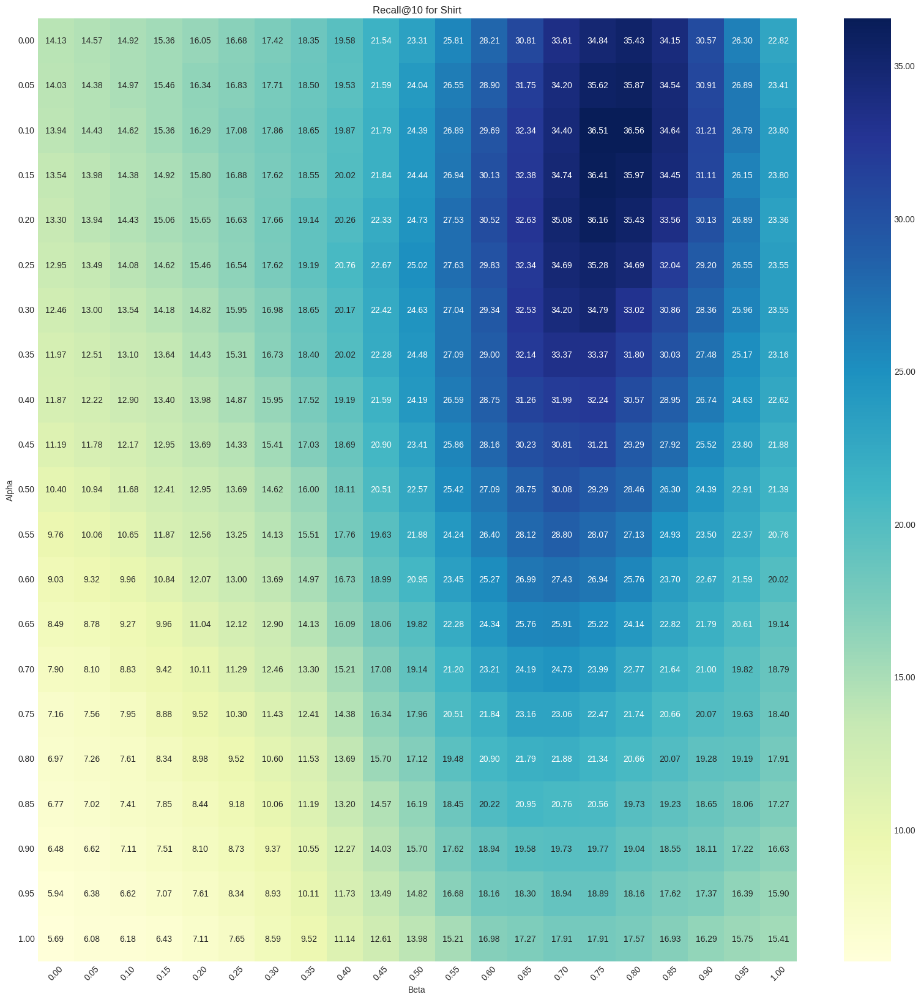

In [31]:
prepare_and_plot_recall_pivot(shirt_recall_at10, "Recall@10 for Shirt")

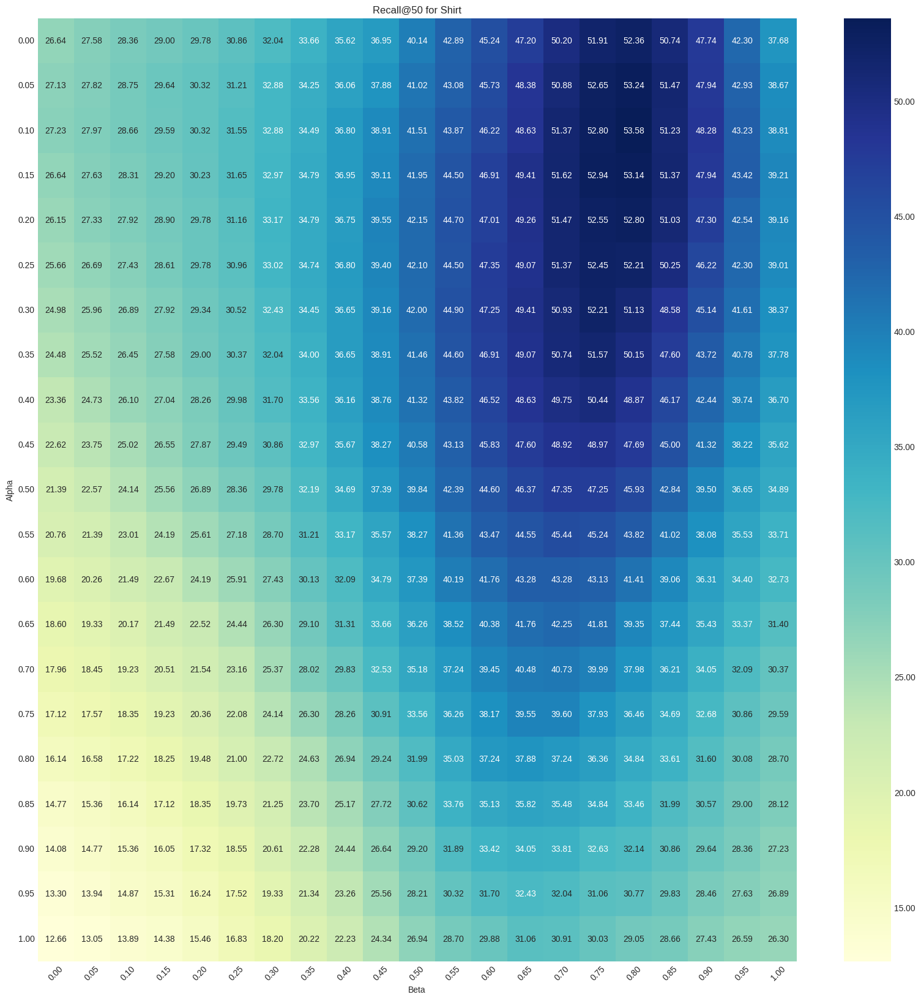

In [32]:
prepare_and_plot_recall_pivot(shirt_recall_at50, "Recall@50 for Shirt")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for Dress</div>

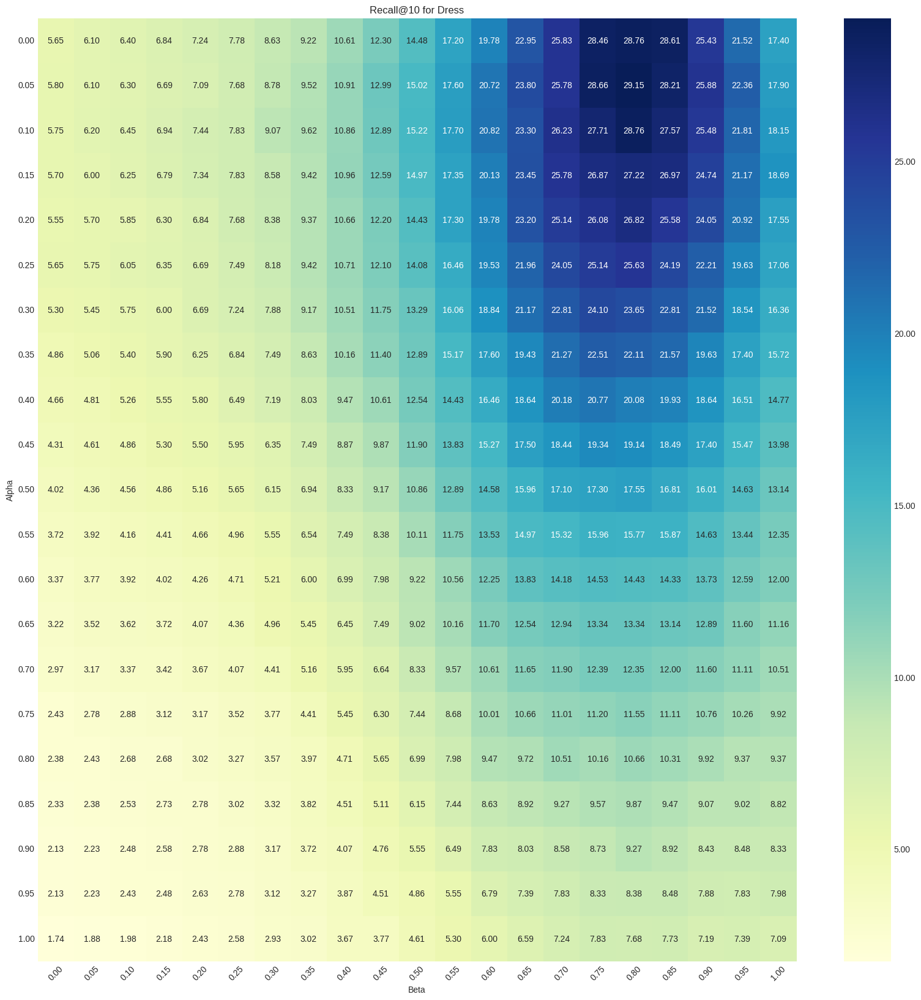

In [33]:
prepare_and_plot_recall_pivot(dress_recall_at10, "Recall@10 for Dress")

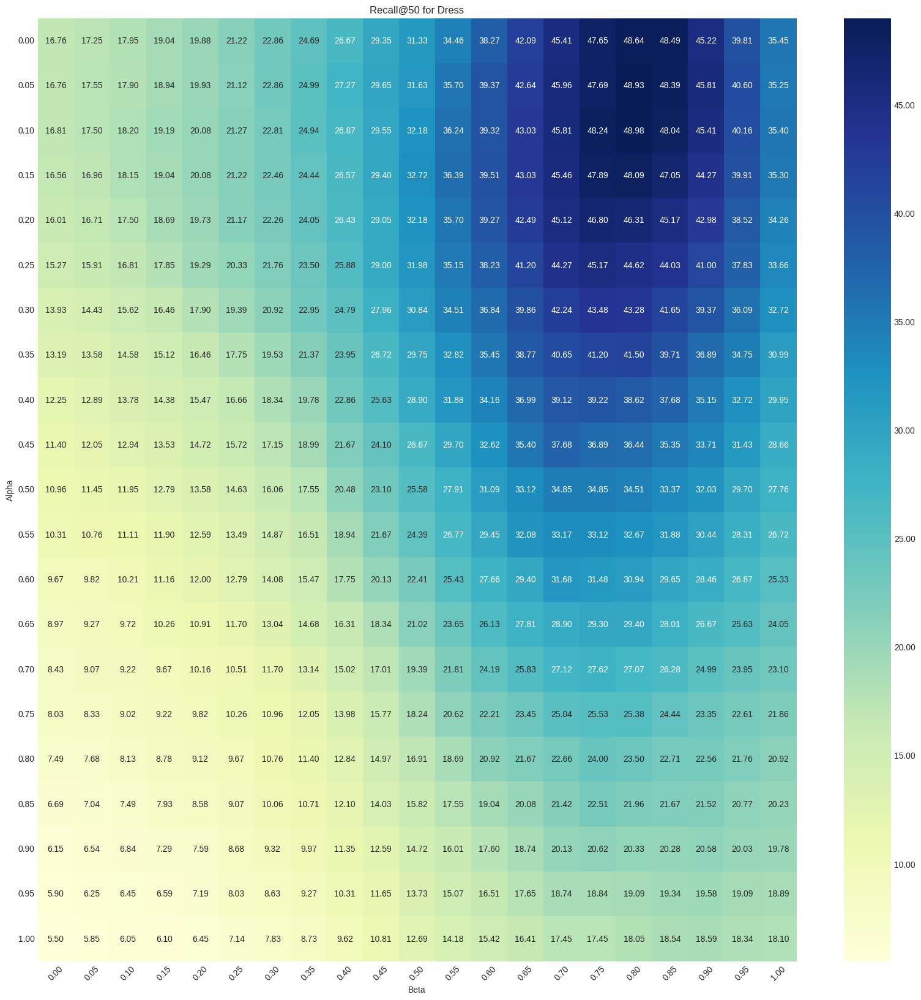

In [34]:
prepare_and_plot_recall_pivot(dress_recall_at50, "Recall@50 for Dress")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for TopTee</div>

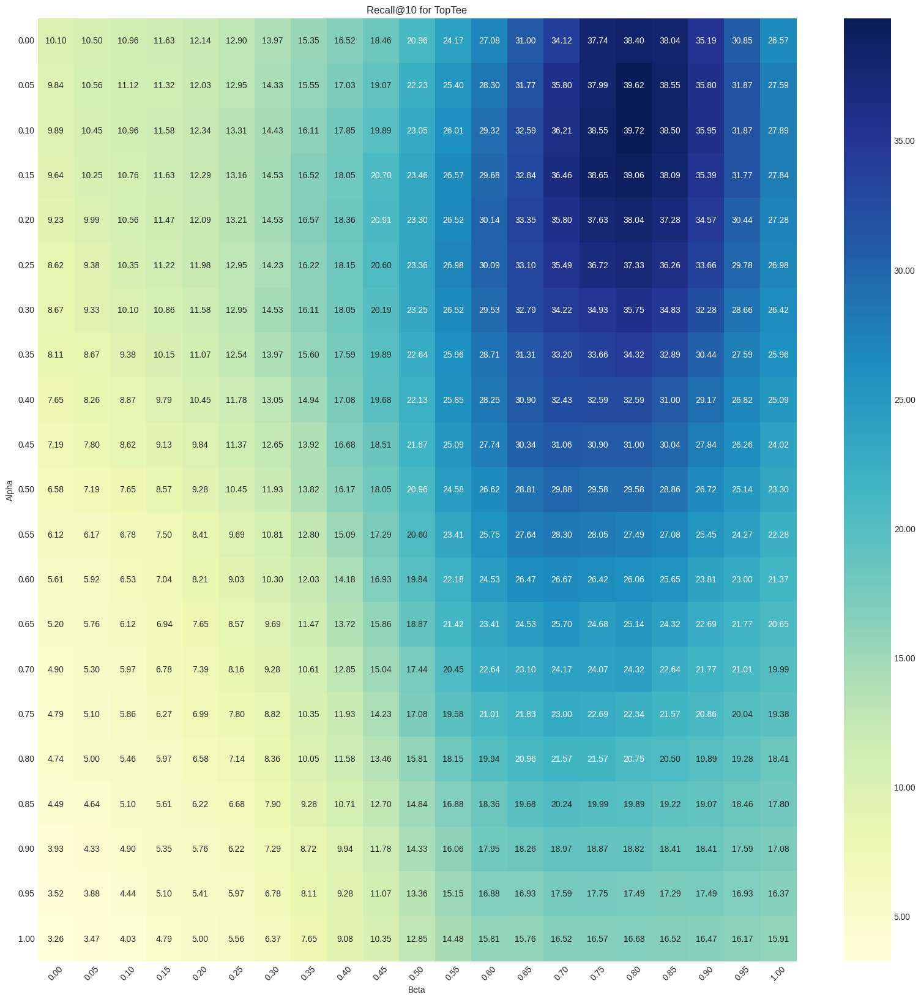

In [35]:
prepare_and_plot_recall_pivot(toptee_recall_at10, "Recall@10 for TopTee")

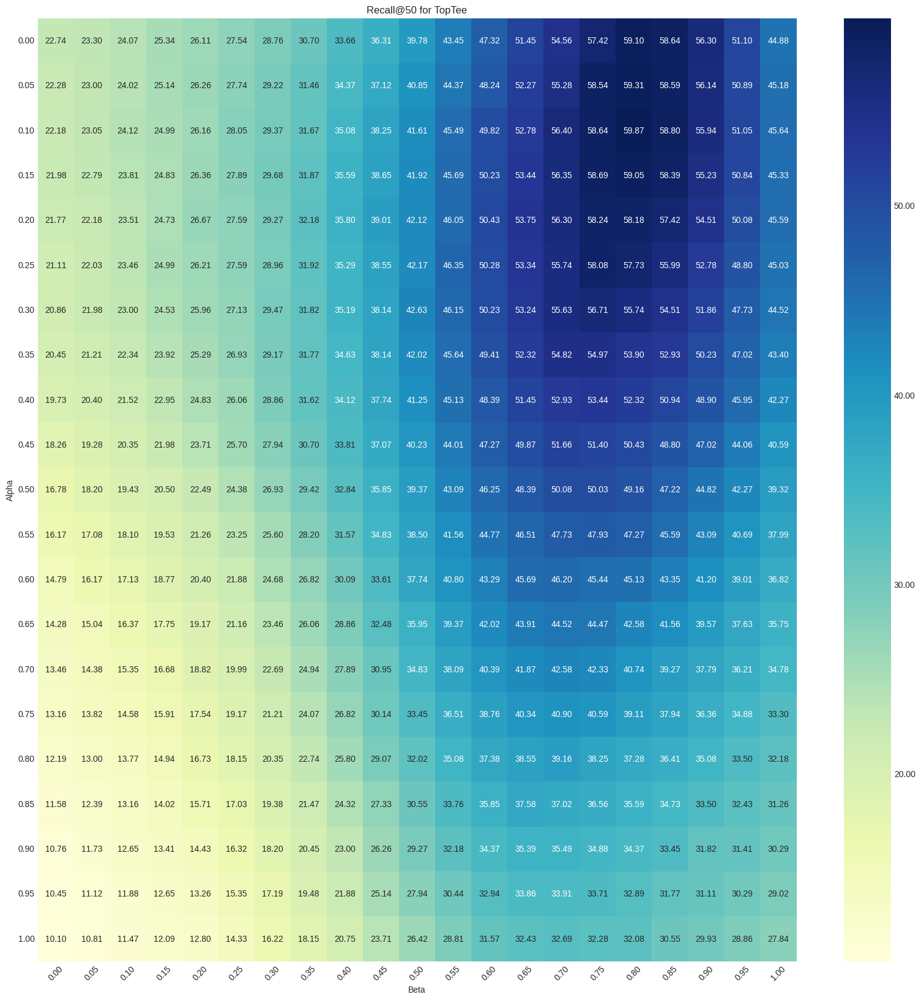

In [36]:
prepare_and_plot_recall_pivot(toptee_recall_at50, "Recall@50 for TopTee")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the average recall at 10 and 50 for all categories</div>

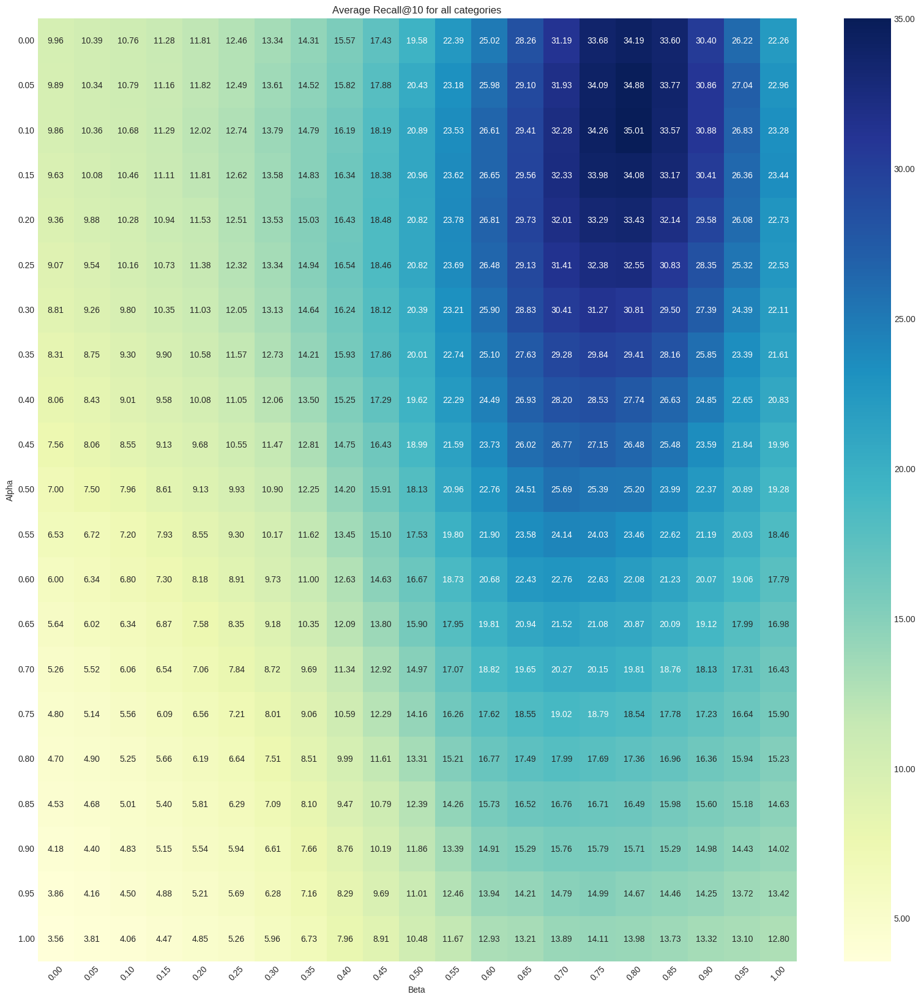

In [37]:
prepare_and_plot_recall_pivot(average_recall_at10, "Average Recall@10 for all categories")

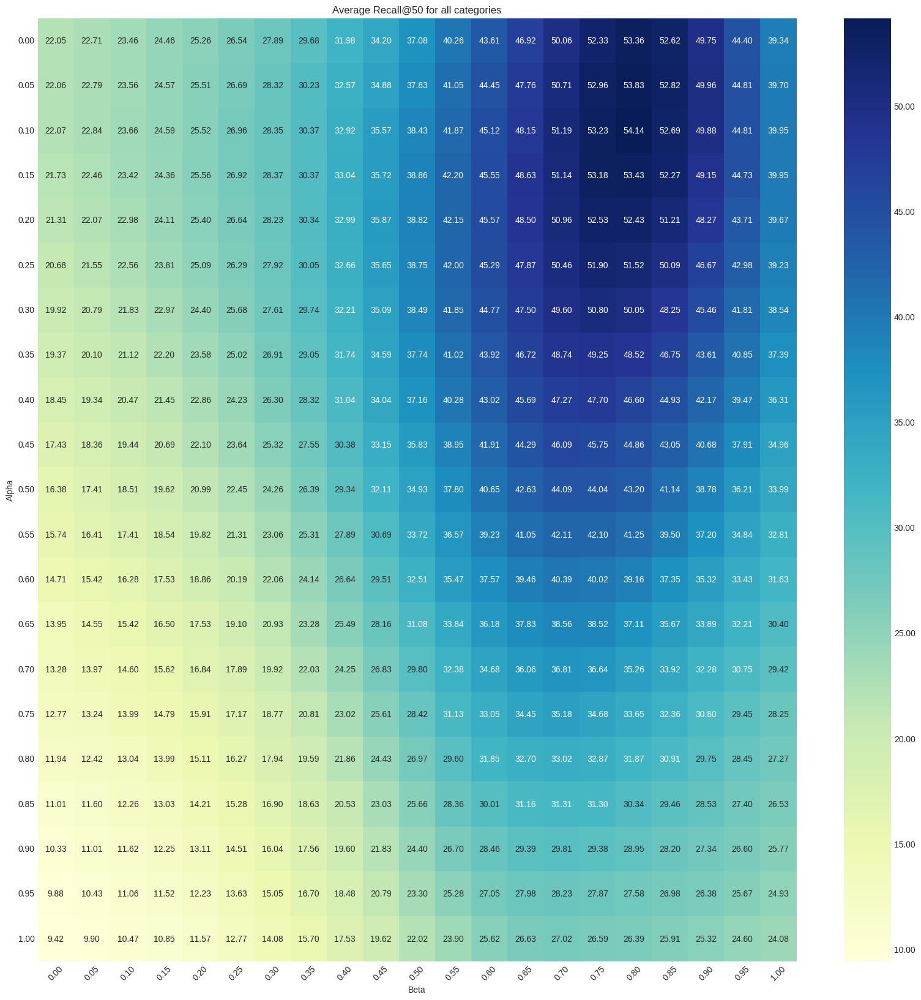

In [38]:
prepare_and_plot_recall_pivot(average_recall_at50, "Average Recall@50 for all categories")

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 5: View some sample of the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to compute the results</div>

In [39]:
def compute_results(
    dress_type: str,
    combining_function: callable,
    clip_text_encoder: torch.nn.Module,
    clip_img_encoder: torch.nn.Module,
    clip_tokenizer,
    text_captions: List[dict],
    preprocess: callable,
    alpha: float = 0.65
) -> Tuple[torch.tensor, List[str], List[str]]:
    """
    View sample results on FashionIQ dataset combining text and image distances.
    
    :param dress_type: FashionIQ category on which perform the retrieval
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined features
    :param clip_text_encoder: BLIP text model
    :param clip_img_encoder: BLIP image model
    :param clip_tokenizer: BLIP tokenizer
    :param text_captions: text captions for the FashionIQ dataset
    :param preprocess: preprocess pipeline
    :param alpha: alpha value for combining text and image distances
    
    :return: [(image_path, text_caption, candidate_image_paths)]
    """
    clip_text_encoder = clip_text_encoder.float().eval()
    clip_img_encoder = clip_img_encoder.float().eval()

    # Define the validation datasets and extract the index features
    classic_val_dataset = FashionIQDataset('val', [dress_type], 'classic', preprocess)

    multiple_text_index_features, multiple_text_index_names = [], []

    for i in range(3):
        index_features, index_names, _ = extract_index_features_with_text_captions_clip(
            classic_val_dataset,
            clip_text_encoder,
            clip_tokenizer,
            text_captions,
            i + 1
        )
        multiple_text_index_features.append(index_features)
        multiple_text_index_names.append(index_names)

    image_index_features, image_index_names = extract_index_features_clip(
        classic_val_dataset,
        clip_img_encoder
    )

    relative_val_dataset = FashionIQDataset('val', [dress_type], 'relative', preprocess)

    all_text_distances = []

    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_text_index_features, multiple_text_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, target_names = generate_fiq_val_predictions(
            clip_text_encoder, 
            clip_tokenizer,
            relative_val_dataset,
            combining_function, 
            text_names,
            text_features
        )
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)

    predicted_image_features, target_names = generate_fiq_val_predictions(
        clip_text_encoder,
        clip_tokenizer,
        relative_val_dataset,
        combining_function,
        image_index_names,
        image_index_features
    )

    # Normalize and compute distances
    image_index_features = F.normalize(image_index_features, dim=-1).float()
    image_distances = 1 - predicted_image_features @ image_index_features.T

    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)

    merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances

    sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
    sorted_index_names = np.array(image_index_names if image_index_names else multiple_text_index_names[0])[
        sorted_indices]
    labels = torch.tensor(
        sorted_index_names == np.repeat(np.array(target_names),
                                        len(image_index_names if image_index_names else multiple_text_index_names[
                                            0])).reshape(len(target_names), -1))
    assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
    recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
    recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100

    print(f"Recall at 10: {recall_at10}")
    print(f"Recall at 50: {recall_at50}")

    return sorted_indices, image_index_names, target_names

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Dress category</div>

In [40]:
sorted_indices_dress, image_index_names_dress, target_names_dress = compute_results(
    'dress',
    get_combing_function_with_beta(0.8),
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0.1
)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:25<00:00,  1.40it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 16:27:33.508490] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.92it/s]


[2024-06-09 16:27:39.964406] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.33it/s]


[2024-06-09 16:27:46.827824] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.31it/s]


[2024-06-09 16:27:53.710581] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.33it/s]


Recall at 10: 28.75557839870453

Recall at 50: 48.98363947868347

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Shirt category</div>

In [41]:
sorted_indices_shirt, image_index_names_shirt, target_names_shirt = compute_results(
    'shirt',
    get_combing_function_with_beta(0.8),
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0.1
)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:22<00:00,  1.40it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 16:31:28.426864] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00, 10.04it/s]


[2024-06-09 16:31:34.960741] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  8.97it/s]


[2024-06-09 16:31:42.107185] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  8.88it/s]


[2024-06-09 16:31:49.325710] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.07it/s]


Recall at 10: 36.555445194244385

Recall at 50: 53.5819411277771

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the TopTee category</div>

In [42]:
sorted_indices_toptee, image_index_names_toptee, target_names_toptee = compute_results(
    'toptee',
    get_combing_function_with_beta(0.8),
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0.1
)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [02:00<00:00,  1.39it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 16:34:53.148371] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.20it/s]


[2024-06-09 16:34:59.893693] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.22it/s]


[2024-06-09 16:35:06.629004] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.17it/s]


[2024-06-09 16:35:13.397802] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.17it/s]


Recall at 10: 39.72463011741638

Recall at 50: 59.867411851882935

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Prepare the ground truth data</div>

In [43]:
def prepare_ground_truths(json_data):
    """
    Prepare ground truth data from the JSON structure.
    
    :param json_data: JSON data containing target and candidate matches with captions
    :return: Dictionary mapping targets to lists of tuples (candidates and captions)
    """
    ground_truths = {}
    for entry in json_data:
        target = entry['target']
        candidate = entry['candidate']
        captions = entry['captions']
        if target not in ground_truths:
            ground_truths[target] = []
        ground_truths[target].append((candidate, captions))  # Store as a tuple
    return ground_truths

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the retrieval results for a query</div>

In [44]:
def plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truths, top_k=5, i=0):
    """
    Plot retrieval results for a specific query showing the query and its top retrieved images, highlighting ground truths
    and displaying associated captions to the left of the query image.

    :param sorted_indices: 2D tensor or array with sorted indices of retrieved images per query.
    :param image_index_names: List of image paths corresponding to indices in sorted_indices.
    :param target_names: List of names or descriptions for each query.
    :param ground_truths: Dictionary mapping target names to lists of tuples (candidates and captions).
    :param top_k: Number of top retrieved results to display per query.
    :param i: Index of the query to display.
    """
    query_index = i
    retrival_result_images = [image_index_names[j] for j in sorted_indices[query_index]][:top_k]
    ground_truth_target = target_names[query_index]
    query_img_path, query_captions = ground_truths.get(ground_truth_target, [('', '')])[0]

    fig = plt.figure(figsize=(30, 5))
    gs = GridSpec(1, top_k + 2, figure=fig)
    query_img = Image.open(f'../fashionIQ_dataset/images/{query_img_path}.png')

    # Subplot for the caption text to the left of the query image
    ax_text = fig.add_subplot(gs[0, 0])
    query_name = query_img_path
    query_captions = '\n'.join(sentences for sentences in query_captions)
    ax_text.text(0.5, 0.5, query_captions, va='center', ha='center')
    ax_text.axis('off')

    # Subplot for the query image
    ax_image = fig.add_subplot(gs[0, 1])
    ax_image.imshow(query_img)
    ax_image.set_title(f"Query: {query_name}", color='blue')
    ax_image.axis('off')

    for j, img_path in enumerate(retrival_result_images):
        img = Image.open(f'../fashionIQ_dataset/images/{img_path}.png')

        ax_result = fig.add_subplot(gs[0, j + 2])
        ax_result.imshow(img)

        # Check if this image is a ground truth and retrieve its captions
        if img_path == ground_truth_target:
            ax_result.set_title(f"{img_path}", color='green')
        else:
            ax_result.set_title(img_path)

        ax_result.axis('off')

    plt.tight_layout()
    plt.show()

In [45]:
ground_truth_dress = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.dress.val.json')))
ground_truth_shirt = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.shirt.val.json')))
ground_truth_toptee = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.toptee.val.json')))

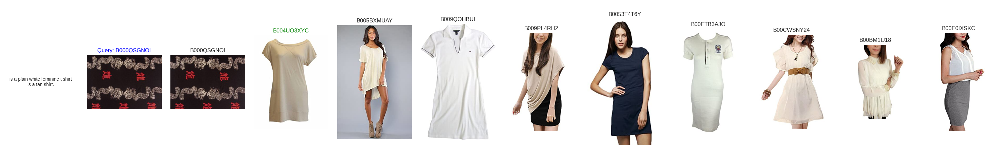

In [46]:
plot_retrieval_results_of_i(sorted_indices_dress, image_index_names_dress, target_names_dress, ground_truth_dress, top_k=10, i=3)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 6: Compare with alpha=0, and without weighted merge beta</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Dress category with alpha=0 and without weighted merge beta</div>

In [47]:
sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin = compute_results(
    'dress',
    combining_function_original,
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [01:25<00:00,  1.40it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 16:38:10.134538] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.92it/s]


[2024-06-09 16:38:16.596065] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.27it/s]


[2024-06-09 16:38:23.509037] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.31it/s]


[2024-06-09 16:38:30.391297] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.26it/s]


Recall at 10: 14.476945996284485

Recall at 50: 31.333664059638977

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Shirt category with alpha=0 and without weighted merge beta</div>

In [48]:
sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin = compute_results(
    'shirt',
    combining_function_original,
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [02:22<00:00,  1.39it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 16:42:05.839558] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:06<00:00,  9.81it/s]


[2024-06-09 16:42:12.374723] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.13it/s]


[2024-06-09 16:42:19.397015] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.12it/s]


[2024-06-09 16:42:26.422122] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:07<00:00,  9.10it/s]


Recall at 10: 23.307164013385773

Recall at 50: 40.13738930225372

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the TopTee category with alpha=0 and without weighted merge beta</div>

In [49]:
sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin = compute_results(
    'toptee',
    combining_function_original,
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [02:00<00:00,  1.39it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 16:45:30.321029] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.17it/s]


[2024-06-09 16:45:37.092479] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.18it/s]


[2024-06-09 16:45:43.856230] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.17it/s]


[2024-06-09 16:45:50.623362] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:06<00:00,  9.18it/s]


Recall at 10: 20.95869481563568

Recall at 50: 39.77562487125397

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [50]:
def found_better_than_original(
        sorted_indices_origin, image_index_names_origin, target_names_origin,
        sorted_indices, image_index_names, target_names, top_k=10
) -> List[int]:
    """
    Return indices of queries where the new retrieval results are better than the original results based on the rank
    of the ground truth in the top_k results.

    Args:
        sorted_indices_origin (np.ndarray): 2D array of sorted indices by relevance per query for the original method.
        image_index_names_origin (List[str]): List of image names corresponding to indices in sorted_indices_origin.
        target_names_origin (List[str]): List of names or descriptions for each query for the original method.
        sorted_indices (np.ndarray): 2D array of sorted indices by relevance per query for the new method.
        image_index_names (List[str]): List of image names corresponding to indices in sorted_indices.
        target_names (List[str]): List of target names each query is supposed to retrieve.
        top_k (int): Number of top retrieved results to consider per query.

    Returns:
        List[int]: List of indices where the new method outperforms the original method in terms of the rank of the
        ground truth target.
    """
    better_indices = []
    total_queries = len(target_names)  # Assuming the same number of queries for both sets

    for index in range(total_queries):
        # Find the index of the ground truth in the top_k results of the original method
        new_rank = [image_index_names[i] for i in sorted_indices[index]].index(target_names[index])
        origin_rank = [image_index_names_origin[i] for i in sorted_indices_origin[index]].index(target_names_origin[index])

        if new_rank <= top_k < origin_rank:
            better_indices.append(index)

    return better_indices

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the Dress category</div>

In [51]:
become_better = found_better_than_original(
    sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin,
    sorted_indices_dress, image_index_names_dress, target_names_dress,
    top_k=10
)

len(become_better), become_better[:10]

(353, [0, 1, 12, 16, 19, 26, 40, 45, 51, 52])

In [52]:
become_worse = found_better_than_original(
    sorted_indices_dress, image_index_names_dress, target_names_dress,
    sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(58, [11, 23, 41, 62, 125, 134, 169, 218, 298, 352])

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the Shirt category</div>

In [53]:
become_better = found_better_than_original(
    sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin,
    sorted_indices_shirt, image_index_names_shirt, target_names_shirt,
    top_k=10
)

len(become_better), become_better[:10]

(356, [0, 6, 13, 16, 19, 21, 26, 32, 37, 45])

In [54]:
become_worse = found_better_than_original(
    sorted_indices_shirt, image_index_names_shirt, target_names_shirt,
    sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(79, [9, 12, 35, 54, 75, 84, 123, 126, 138, 184])

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the TopTee category</div>

In [55]:
become_better = found_better_than_original(
    sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin,
    sorted_indices_toptee, image_index_names_toptee, target_names_toptee,
    top_k=10
)

len(become_better), become_better[:10]

(423, [6, 7, 9, 10, 15, 20, 21, 26, 28, 30])

In [56]:
become_worse = found_better_than_original(
    sorted_indices_toptee, image_index_names_toptee, target_names_toptee,
    sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(53, [31, 96, 112, 142, 216, 230, 243, 292, 484, 486])

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 7: Visualize the comparison</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the Dress category</div>

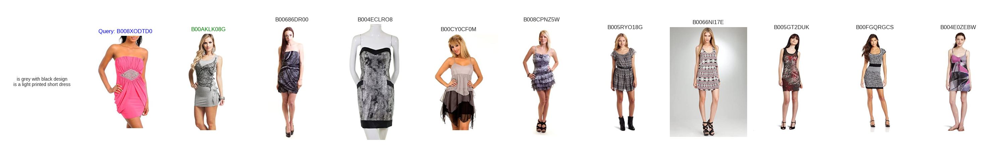

In [61]:
plot_retrieval_results_of_i(sorted_indices_dress, image_index_names_dress, target_names_dress, ground_truth_dress, top_k=10, i=1)

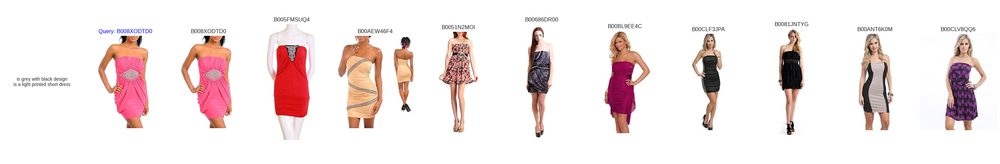

In [62]:
plot_retrieval_results_of_i(sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin, ground_truth_dress, top_k=10, i=1)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the Shirt category</div>

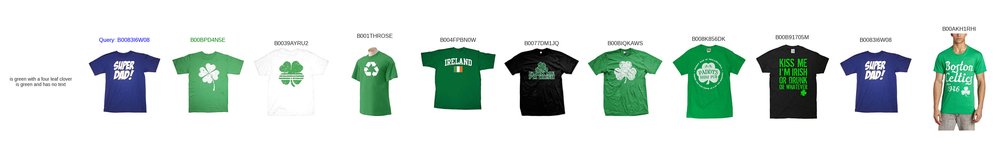

In [63]:
plot_retrieval_results_of_i(sorted_indices_shirt, image_index_names_shirt, target_names_shirt, ground_truth_shirt, top_k=10, i=1)

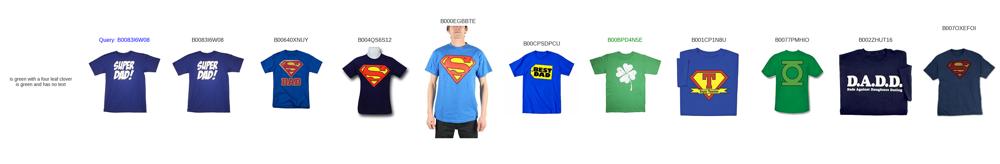

In [64]:
plot_retrieval_results_of_i(sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin, ground_truth_shirt, top_k=10, i=1)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the TopTee category</div>

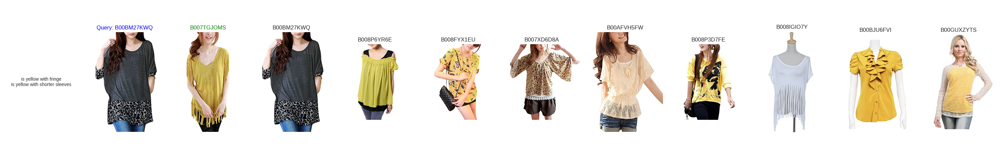

In [65]:
plot_retrieval_results_of_i(sorted_indices_toptee, image_index_names_toptee, target_names_toptee, ground_truth_toptee, top_k=10, i=2)

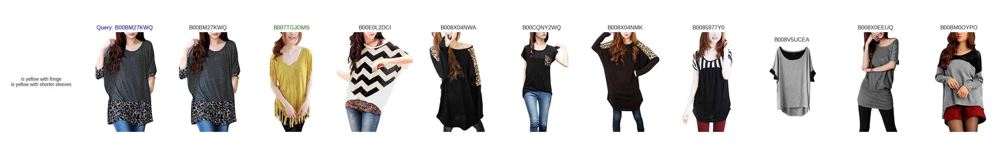

In [66]:
plot_retrieval_results_of_i(sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin, ground_truth_toptee, top_k=10, i=2)